---
author: Anna Duan
format:
    html:
        page-layout: full
        code-fold:  true
execute:
    warning:    false
    message:    false
---

# Exploratory Analysis
In this portion of our analysis, we use maps and correlation analysis to address the folowing questions:

- What is the amenity landscape in Philadelphia like, particularly beyond the downtown area?  
  
- How much variation is there within amenity categories, such as restaurants?  

In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import altair as alt
import hvplot.pandas as hv
from sklearn.cluster import KMeans
import re
from wordcloud import WordCloud
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
echo: False


# Show all columns in dataframes
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

np.seterr(invalid="ignore");

In [2]:
# amenities
amenity_summed = gpd.read_file("../data/amenities_grouped.csv")
amenity_point = gpd.read_file("../data/amenities_phl_gdf.geojson")
amenity_neigh = gpd.read_file("../data/amenities_neigh.geojson")
amenity_tract = gpd.read_file("../data/amenities_tract.geojson")

In [3]:
# boundaries 
phl_bound = gpd.read_file("../data/Yelp API/phl_bound.geojson")
phl_neigh = gpd.read_file("https://raw.githubusercontent.com/opendataphilly/open-geo-data/master/Neighborhoods_Philadelphia/Neighborhoods_Philadelphia.geojson")
phl_tract = gpd.read_file("../data/tract.geojson")
districts = gpd.read_file("../data/Planning_Districts.geojson")

# reproject boundaries
phl_bound_proj = phl_bound.to_crs(2272)
phl_neigh_proj = phl_neigh.to_crs(2272)
phl_tract_proj = phl_tract.to_crs(2272)
districts_proj = districts.to_crs(2272)

neigh = phl_neigh_proj[["mapname", "geometry"]].copy()
neigh["nb_name"] = neigh["mapname"]

district = districts_proj[["DIST_NAME", "geometry"]].copy()

district = district.copy()
# Calculate area in square meters
district['area_m2'] = district['geometry'].area

# Convert area to square miles (1 square mile = 2,589,988.11 square meters)
district['area_mi2'] = district['area_m2'] / 27878400

## Where are Philly's amenities found?

After cleaning and de-duplicating our Yelp Fusion API data, we have a dataframe of 7579 total entries, with 5441 unique amenities.

In [4]:
amenity_point["name"].nunique()

5441

Below are the point locations of the amenities we pulled from the API, colored by their category.

In [5]:
amenity_point.explore(tiles='CartoDB dark_matter', legend=True, column='type')

In sheer count and density, the Center City region is the most populated with amenities. 

In [6]:
amenity_neigh_sum = amenity_neigh.groupby("nb_name")["count_per_mi2"].sum().reset_index()
amenity_neigh_sum = amenity_neigh_sum.merge(amenity_neigh[["geometry", "nb_name"]], on = "nb_name", how = "left")
amenity_neigh_sum = gpd.GeoDataFrame(amenity_neigh_sum, geometry = "geometry")
amenity_neigh_sum["count_per_mi2"] = amenity_neigh_sum["count_per_mi2"].round(0)
amenity_neigh_sum.explore(tiles='CartoDB dark_matter', legend=True, column='count_per_mi2', cmap='viridis')

The average count of amenities per square mile is 7.8 times higher in the Central planning district (283) compared to the rest of the city (36).

In [7]:
# Step 1: Dissolve non-central districts
not_central = district[district['DIST_NAME'] != "Central"].copy()
not_central['group'] = 'Other Districts'
# Ensure geometry is consistent before dissolve
not_central = not_central.set_geometry('geometry', crs=district.crs)
merged_not_central_gdf = not_central.dissolve(by='group', aggfunc='sum', numeric_only = True).reset_index()
merged_not_central_gdf = merged_not_central_gdf[["group", "geometry", "area_mi2"]]

In [8]:
# Step 2: Separate DataFrame for Central District
central_gdf = district[district['DIST_NAME'] == "Central"].copy()
central_gdf['group'] = 'Center City'
central_gdf = central_gdf[["group", "geometry", "area_mi2"]]

In [9]:
# Step 3: Concatenate both DataFrames
central_comp_gdf = gpd.GeoDataFrame(pd.concat([central_gdf, merged_not_central_gdf], ignore_index=True))

In [10]:
# Group and sum total_amenities by neighborhood
amenity_neigh_sum = amenity_neigh.groupby("nb_name")["total_amenities"].first().reset_index()

# Get unique geometry for each neighborhood
unique_geometry = amenity_neigh[["nb_name", "geometry"]].drop_duplicates()

# Merge the summed data with the unique geometrical data
amenity_neigh_sum_gdf = amenity_neigh_sum.merge(unique_geometry, on="nb_name", how="left")

# Convert to GeoDataFrame
amenity_neigh_sum_gdf = gpd.GeoDataFrame(amenity_neigh_sum_gdf, geometry="geometry")

# Calculate centroid of geometry
amenity_neigh_sum_gdf.geometry = amenity_neigh_sum_gdf.geometry.centroid


# intersect with districts
central_comp = central_comp_gdf.sjoin(amenity_neigh_sum_gdf)

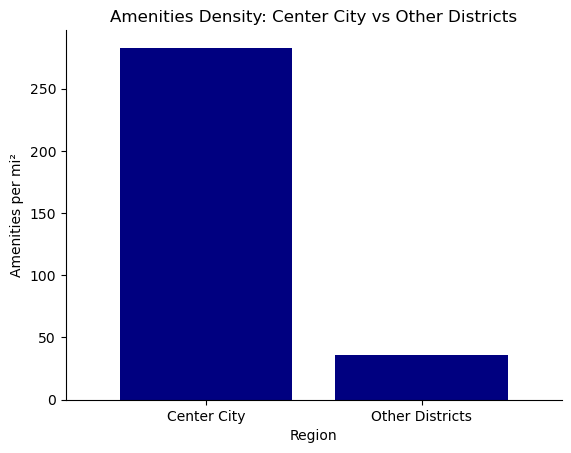

In [11]:
central_comp_sum = central_comp.groupby("group")[["total_amenities"]].sum()
central_comp_area = central_comp.groupby("group")[["area_mi2"]].first()
central_comp_bar = central_comp_sum.merge(central_comp_area, on = "group", how = "inner")
central_comp_bar["amenities_per_mi2"] = central_comp_bar["total_amenities"]/central_comp_bar["area_mi2"].round(2)

# plot
ax = central_comp_bar['amenities_per_mi2'].plot(kind='bar', color='navy', width=0.8, title='Amenities Density: Center City vs Other Districts')

# Remove top and right spines (box)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Optionally, you can also remove left and bottom spines if you prefer
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)

# Adjust other plot settings as needed
ax.set_ylabel('Amenities per mi²')
ax.set_xlabel('Region')
plt.xticks(rotation=0)  # Rotate x-axis labels if needed

# Show the plot
plt.show()

In [12]:
central_comp_gdf = central_comp_gdf.merge(central_comp_bar, on = "group", how = "inner")
central_comp_gdf["amenities_per_mi2"] = central_comp_gdf["amenities_per_mi2"].round(0)

In [13]:
central_comp_gdf[["group", "amenities_per_mi2", "geometry"]].explore(tiles='CartoDB dark_matter', legend=True, column='amenities_per_mi2', categorical = True)

## What is the composition of Philadelphia's amenity landscape?

We used a wide range of category terms to pull amenity listings from Yelp's API. The more frequent categories are restaurant, beauty/grooming, and shopping.

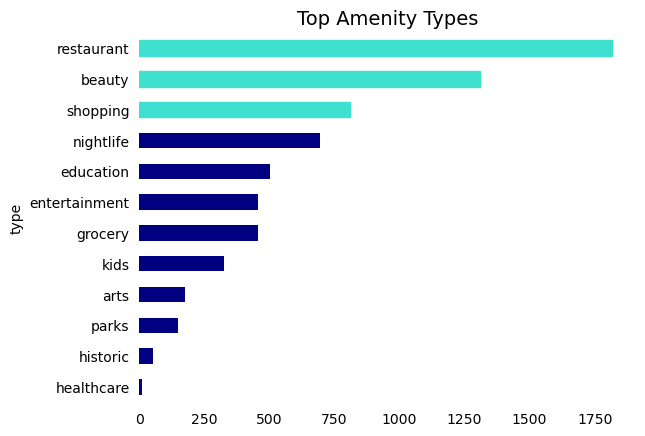

In [14]:
amenity_summed["count"] = amenity_summed["count"].astype(int)
amenities_ranked = amenity_summed[["type", "count"]].sort_values("count", ascending = False)

# Sort the DataFrame in descending order for the plot
amenities_ranked_sorted = amenities_ranked.sort_values('count', ascending=False)

# Create the horizontal bar plot
ax = amenities_ranked_sorted.plot.barh(x="type", y="count", color='navy', legend=False)

# Highlight the top 3 bars
bars = ax.patches
for bar in bars[:3]:  # Change the color of the top 3 bars
    bar.set_color('turquoise')

# Remove the spines (box) around the plot
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)  # Remove the bottom spine (x-axis line)

# Remove the ticks and labels for the x-axis
ax.tick_params(left=False, bottom=False)

# Invert the y-axis to have the highest value at the top
ax.invert_yaxis()

# Add a title
ax.set_title("Top Amenity Types", fontsize=14)

# Show the plot
plt.show()

Mapped separately, we can see distinct patterns in the locations of each type of amenity. Restaurants and beauty amenities lay in clusters spread throughout the city, while parks, arts, and nightlife are most concentrated in Center City. Historic landmarks, by contrast, are concentrated in the Old City area which houses a number of museums and historic sites.

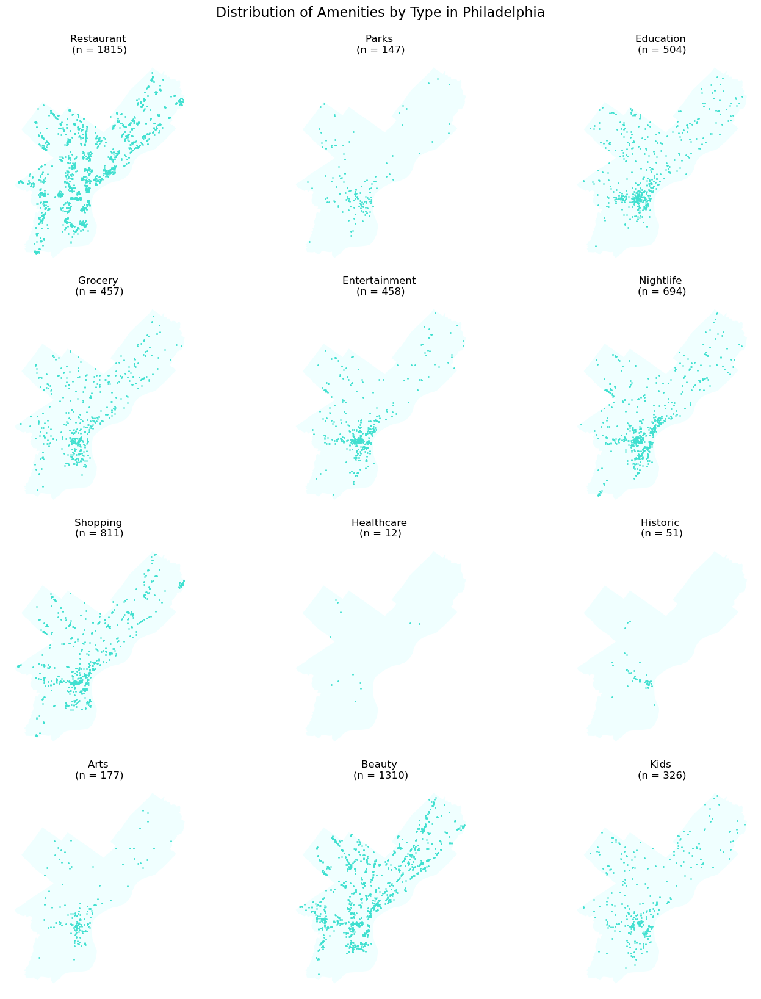

In [15]:
# Extract unique business types
business_types = amenity_point['type'].unique()

# Determine the number of rows and columns for the subplots
n_rows = len(business_types) // 3 + (len(business_types) % 3 > 0)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, n_rows * 4))

# Flatten the axes array for easy looping
axes = axes.flatten()

# Create a map for each business type
for i, business_type in enumerate(business_types):
    # Filter data for the current business type
    subset = amenity_point[amenity_point['type'] == business_type]

    # Get count for the current business type
    count = amenity_summed[amenity_summed['type'] == business_type]['count'].values[0]
    
    # phl boundary
    phl_bound_proj.plot(ax=axes[i], color='azure')
    
    # Plotting with transparency
    subset.plot(ax=axes[i], color='turquoise', markersize=1, alpha=1)

    # Set title with count (n = count)
    axes[i].set_title(f"{business_type.capitalize()} \n(n = {count})")

    # Customizations: Remove boxes, axis ticks, and labels
    axes[i].set_axis_off()

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])
    
# Adjust layout
plt.tight_layout()

# Add main title for the figure
fig.suptitle('Distribution of Amenities by Type in Philadelphia', fontsize=16, y=1.02)

# Display the panel of maps
plt.show()

## Where are hotspots for each amenity type?

To account for neighborhoods with inherently higher amenity counts, we computed the percentage share of each amenity type within each neighborhood. This approach allows us to discern the relative prominence of each amenity type, decoupled from the overall density of amenities.

Our analysis of amenity shares across Philadelphia's neighborhoods reveals a pattern: amenities like grocery stores, beauty/grooming services, and restaurants consistently represent a significant portion of amenities in various neighborhoods. In contrast, amenities such as nightlife, parks, arts, and entertainment are predominantly concentrated in specific neighborhoods, indicating a more selective distribution across the city.

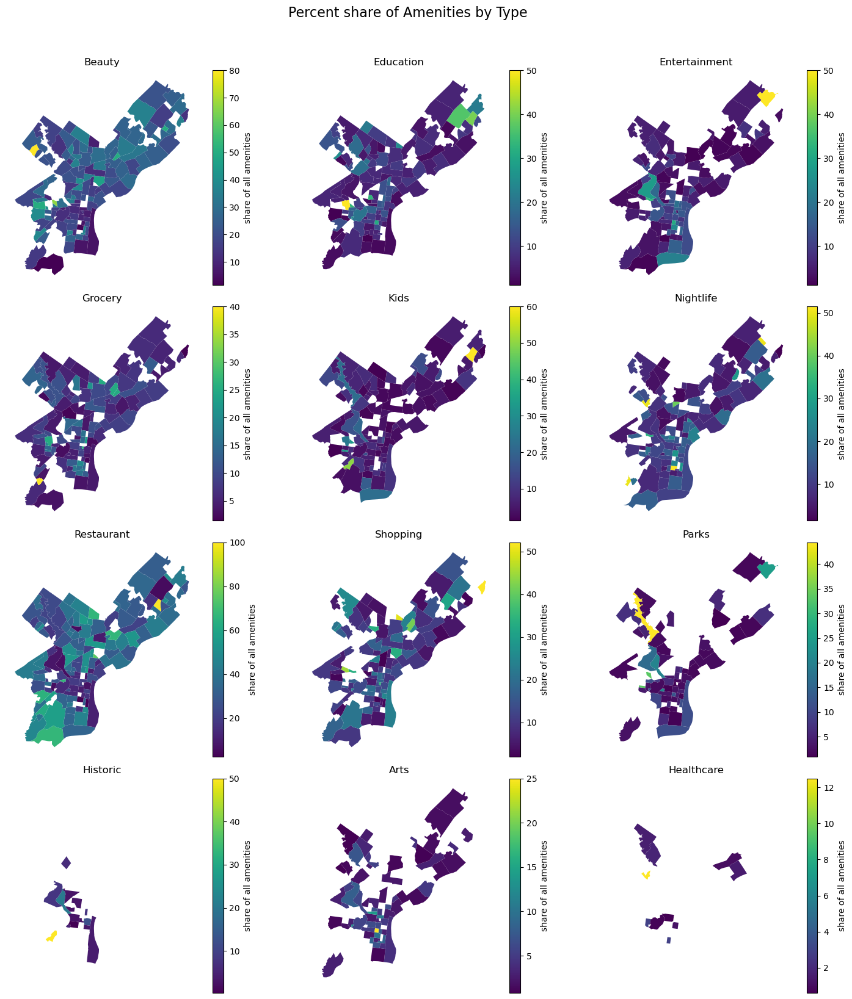

In [16]:
# Extract unique types
amenity_types = amenity_neigh['type'].unique()

# Determine the number of rows and columns for the subplots
n_rows = len(amenity_types) // 3 + (len(amenity_types) % 3 > 0)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, n_rows * 4))

# Flatten the axes array for easy looping
axes = axes.flatten()

# Create a choropleth map for each amenity type
for i, amenity_type in enumerate(amenity_types):
    # Filter data for the current amenity type
    subset = amenity_neigh[amenity_neigh['type'] == amenity_type]
    
    # phl boundary
    phl_bound_proj.plot(ax=axes[i], color='white')
    

    # Plotting
    subset.plot(column='pct_share', ax=axes[i], legend=True,
                legend_kwds={'label': "share of all amenities"},
                cmap='viridis')

    # Set title
    axes[i].set_title(amenity_type.capitalize())
    
     # Remove boxes, axis ticks, and axis labels
    axes[i].set_axis_off()

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

    
# Add main title for the figure
fig.suptitle('Percent share of Amenities by Type', fontsize=16, y=1.02)


# Adjust layout
plt.tight_layout()

# Display the panel of maps
plt.show()

## Word clouds: yelp listings

The text from Yelp listings also provides insightful details about Philadelphia's amenity landscape. A word cloud generated from the titles of these listings reveals that terms like "pizza", "salon", "bar", "school", "studio", "restaurant", and "park" are prominently featured. This visualization offers a snapshot of the most common types of amenities found in the city, as reflected in the Yelp data.

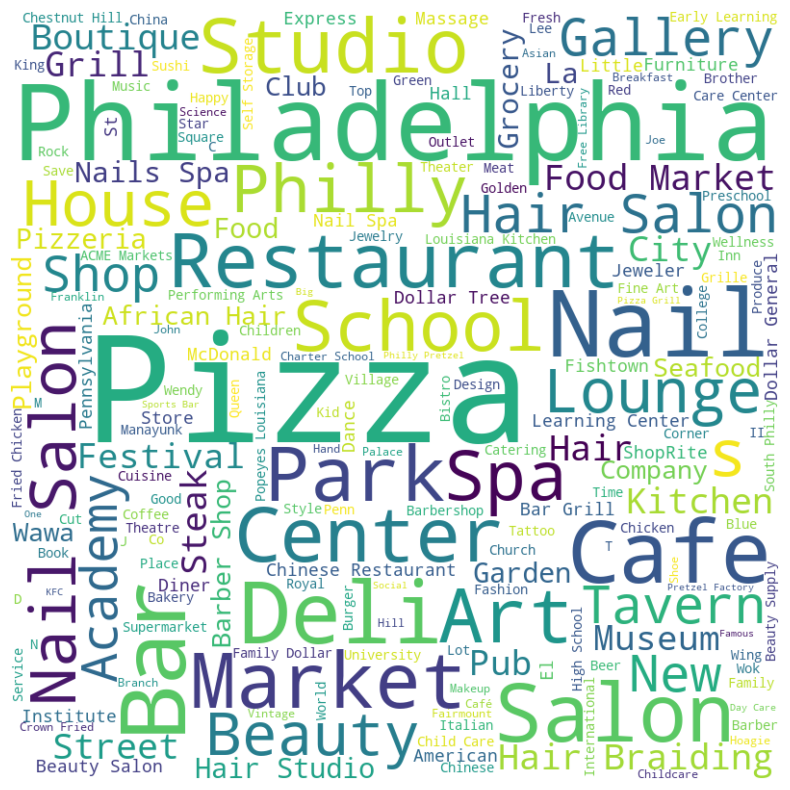

In [17]:
# Concatenate all text in the column
text = ' '.join(amenity_point["name"].dropna())

# Create the word cloud
wordcloud = WordCloud(width=800, height=800, background_color ='white').generate(text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

Similarly, looking at the first word in yelp's "alias" field, we see that "bakeries", "cafes", "grocery", "theater", "sandwiches", and "delis" are some of the most prominent descriptions of amenity listings.

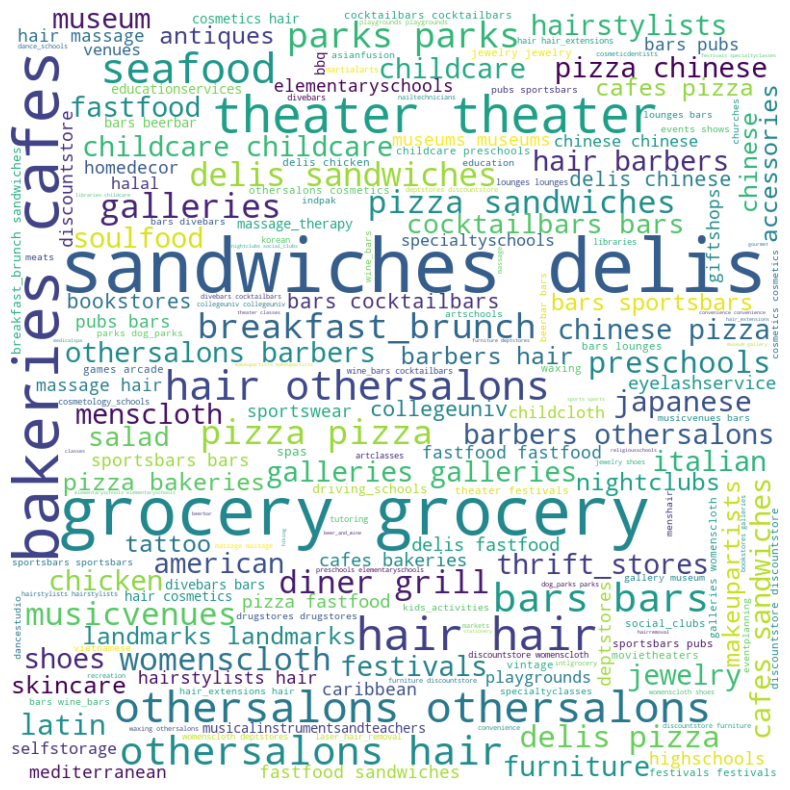

In [18]:
# Concatenate all text in the column
text = ' '.join(amenity_point["desc_1"].dropna())

# Create the word cloud
wordcloud = WordCloud(width=800, height=800, background_color ='white').generate(text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

## Amenity type correlations
Examining the correlations among neighborhoods based on amenity types, we observe moderate associations. For instance, there is a correlation of 0.52 between entertainment and arts amenities, and a 0.47 correlation between amenities for kids and historic sites. Interestingly, there is a negative correlation of -0.5 between restaurants and entertainment amenities. The absence of any correlations exceeding 0.75 indicates that our categorized amenities are distinct and subject to different spatial dynamics.

In [19]:
# spreading the data
amenity_neigh_wide = amenity_neigh.pivot_table(index='nb_name', columns='type', values='pct_share', aggfunc=np.mean).fillna(0)

# Calculating the correlation matrix
correlation_matrix = amenity_neigh_wide.corr()

# Mask to remove upper triangular matrix (including the diagonal)
mask = np.tril(np.ones_like(correlation_matrix, dtype=bool))

# Apply the mask to the correlation matrix
filtered_matrix = correlation_matrix.mask(mask)

# Reset index and melt for Altair
heatmap_data = filtered_matrix.reset_index().melt('type', var_name='type2', value_name='correlation').dropna()

# Create the heatmap
heatmap = alt.Chart(heatmap_data).mark_rect().encode(
    x='type:N',
    y='type2:N',
    color=alt.Color('correlation:Q', scale=alt.Scale(scheme='viridis'))
)

# Add text to each cell
text = heatmap.mark_text(baseline='middle').encode(
    text=alt.Text('correlation:Q', format='.2f'),
    color=alt.condition(
        alt.datum.correlation < 0.4, 
        alt.value('white'),
        alt.value('black')
    )
)

# Display the chart
chart = (heatmap + text).properties(width=600, height=600, title='Amenity Category Correlations')
chart

alt.LayerChart(...)

#  How much variation is there within amenity categories?
This section delves into the diversity present within various amenity categories. Utilizing our Yelp dataset, we specifically focus on the "alias" field, which offers insights into potential sub-categories for each listing. This field typically contains up to three terms that hint at more nuanced classifications. For example, a listing for a pizza shop might be tagged with aliases like "pizza," "restaurant," and "italian," each term revealing a different aspect of the business. By analyzing these aliases, we aim to uncover the range of variations and sub-categories that exist within each broader amenity category.

## Restaurants
The category of restaurants has the highest variation of all our amenity categories. From formal sit-down restaurants to takeaway cheesesteak joints, we wanted to explore the diversity of the Philadelphia food scene. Following are the top 10 food categories, with "pizza" a clear winner at 323 restaurants, or 16.6% of all restaurants in Philly.

In [20]:
restaurants = amenity_point[amenity_point["type"] == "restaurant"]
restaurants_cat = restaurants.groupby("desc_1").size().sort_values(ascending=False).reset_index(name='count')
top_restaurants_cat = restaurants_cat.head(10)

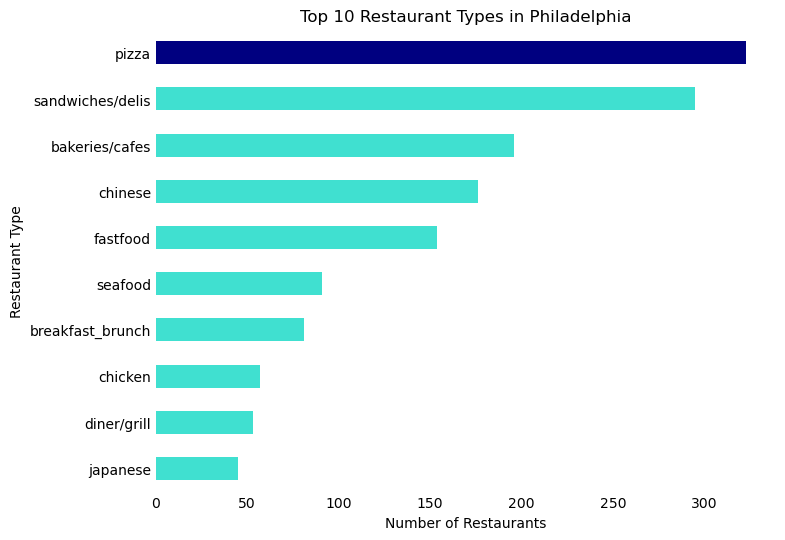

In [21]:
# Sort the DataFrame in descending order of 'count'
top_restaurants_cat_sorted = top_restaurants_cat.sort_values('count', ascending=False)

# Create a color list - default to turquoise, but navy for 'Pizza'
colors = ['navy' if x == 'pizza' else 'turquoise' for x in top_restaurants_cat_sorted['desc_1']]

# Create the horizontal bar plot with reversed axes
ax = top_restaurants_cat_sorted.plot.barh(x='desc_1', y='count', figsize=(8, 6), color=colors)

# Remove the box (spines)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Remove tick marks
ax.tick_params(axis='x', length=0)
ax.tick_params(axis='y', length=0)

# Remove legend
ax.legend().set_visible(False)

# Rename axes
ax.set_xlabel('Number of Restaurants')
ax.set_ylabel('Restaurant Type')

# Invert the y-axis to have the highest value at the top
ax.invert_yaxis()

# Add title
ax.set_title('Top 10 Restaurant Types in Philadelphia')

# Display the plot
plt.show()

### Most common sub-category by neighborhood

Mapping the most common restaurant type by neighborhood, we see that the northeast and far north are the main contributors to the count of pizza shops, while downtown is dominated by bakeries and cafes. 

In [22]:
restaurants_neigh = restaurants.sjoin(neigh)
restaurants_cat_neigh = restaurants_neigh.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')
# get top restaurant type by neighborhood
top_cat_neigh = restaurants_cat_neigh.groupby("nb_name").apply(lambda x: x.nlargest(1, 'count')).reset_index(drop=True)

# join with neighborhoods
top_cat_neigh_gdf = top_cat_neigh.merge(neigh, on = "nb_name", how = "left")
top_cat_neigh_gdf = gpd.GeoDataFrame(top_cat_neigh_gdf, geometry = "geometry")
top_cat_neigh_gdf = top_cat_neigh_gdf[top_cat_neigh_gdf["count"] >= 3]
top_cat_neigh_gdf[["nb_name", "desc_1", "geometry"]].explore(tiles='CartoDB positron', legend=True, column='desc_1', cmap = "Set2")

In [23]:
restaurants_tract = restaurants.sjoin(phl_tract_proj)
restaurants_cat_tract = restaurants_tract.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')

cat_tract = restaurants_cat_tract.groupby(["nb_name", "desc_1"])["count"].sum().reset_index()
# join with neighborhoods
cat_tract_gdf = cat_tract.merge(phl_tract_proj, on = "nb_name", how = "left")

cat_tract_gdf = gpd.GeoDataFrame(cat_tract_gdf, geometry = "geometry")

### Count by sub-category by tract

Following, we can see that just like amenities at large, sub-categories of restaurants also vary in spatial distribution. Some restaurant types such as Chinese and pizza have a consistent presence throughout the city. Others, like Italian and Caribbean, are more concentrated in specific regions.

In [24]:
# tract base
tract_plot = phl_tract_proj.hvplot(crs=2272, geo=True, color="black", line_color="black", width=800, height=800)

# base
cat_tract_gdf_plot = cat_tract_gdf.hvplot(crs=2272, geo=True, c='count', cmap='magma', hover_cols='all', groupby="desc_1", width=800, height=800)

# combine
final_plot = tract_plot * cat_tract_gdf_plot
# reveal
final_plot = final_plot.opts(title="Restaurant Type by Tract")

final_plot

:DynamicMap   [desc_1]
   :Overlay
      .Polygons.I  :Polygons   [Longitude,Latitude]
      .Polygons.II :Polygons   [Longitude,Latitude]   (count,index,nb_name,desc_1,area_mi2)

## Nightlife

The most common nightlife amenity in Philadelphia is a regular bar, followed by specialty bars such as sports bars, wine bars, and pubs.

In [25]:
nightlife = amenity_point[amenity_point["type"] == "nightlife"]
nightlife_cat = nightlife.groupby("desc_1").size().sort_values(ascending=False).reset_index(name='count')
top_night_cat = nightlife_cat.head(10)

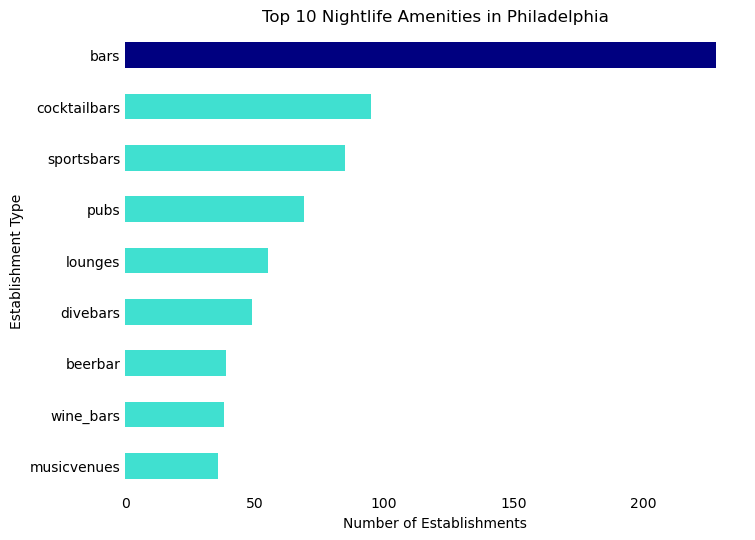

In [26]:
# Sort the DataFrame in descending order of 'count'
top_night_cat_sorted = top_night_cat.sort_values('count', ascending=False)

# Create a color list - default to turquoise, but navy for 'Pizza'
colors = ['navy' if x == 'bars' else 'turquoise' for x in top_night_cat_sorted['desc_1']]

# Create the horizontal bar plot with reversed axes
ax = top_night_cat_sorted.plot.barh(x='desc_1', y='count', figsize=(8, 6), color=colors)

# Remove the box (spines)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Remove tick marks
ax.tick_params(axis='x', length=0)
ax.tick_params(axis='y', length=0)

# Remove legend
ax.legend().set_visible(False)

# Rename axes
ax.set_xlabel('Number of Establishments')
ax.set_ylabel('Establishment Type')

# Invert the y-axis to have the highest value at the top
ax.invert_yaxis()

# Add title
ax.set_title('Top 10 Nightlife Amenities in Philadelphia')

# Display the plot
plt.show()

### Most common sub-category by neighborhood

Looking at a map showcasing the most prevalent types of nightlife amenities by neighborhood in Philadelphia reveals distinct patterns. Bars are a common fixture throughout the city, but there's notable variation in the types of nightlife across different areas.

**Center City**  
Center City stands as a bustling hub of Philadelphia's nightlife, showcasing a diverse array of venues. This area is characterized by a mix of cocktail bars, lounges, pubs, and music venues, in addition to traditional bars, reflecting its vibrant and varied night scene.

**South Philadelphia**  
In South Philadelphia, known for being the home of major sports teams like the Eagles, Sixers, Flyers, and Phillies, the nightlife is heavily influenced by sports culture. Neighborhoods such as Packer Park and the Stadium District are predominantly known for their sports bars.

**Northeast Philadelphia**  
Northeast Philadelphia echoes South Philadelphia in terms of its nightlife, with a strong presence of sports bars and pubs. This similarity underlines a shared preference for relaxed and sports-centric venues in these regions.

**Fairmount**  
Fairmount, the locale of iconic landmarks like Fairmount Park, the Mann Center, and the Philadelphia Museum of Art, leans towards music venues in its nightlife scene. This trend aligns with the area's cultural and artistic atmosphere, making it a go-to destination for music enthusiasts.

In [27]:
night_neigh = nightlife.sjoin(neigh)
night_cat_neigh = night_neigh.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')
# get top nightlife type by neighborhood
top_cat_neigh = night_cat_neigh.groupby("nb_name").apply(lambda x: x.nlargest(1, 'count')).reset_index(drop=True)

# join with neighborhoods
top_cat_neigh_gdf = top_cat_neigh.merge(neigh, on = "nb_name", how = "left")
top_cat_neigh_gdf = gpd.GeoDataFrame(top_cat_neigh_gdf, geometry = "geometry")
top_cat_neigh_gdf = top_cat_neigh_gdf[top_cat_neigh_gdf["count"] >= 2]
top_cat_neigh_gdf[["nb_name", "desc_1", "geometry"]].explore(tiles='CartoDB positron', legend=True, column='desc_1', cmap = "Set2")

### Count by sub-category by tract

A map of counts of each nightlife amenity type by tract confirms these trends. Bars, while clustered in Center City, are present throughout the city. By contrast, pubs, music venues, and sports bars show distinct hotspots.

In [28]:
night_tract = nightlife.sjoin(phl_tract_proj)
night_cat_tract = night_tract.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')

cat_tract = night_cat_tract.groupby(["nb_name", "desc_1"])["count"].sum().reset_index()
# join with neighborhoods
cat_tract_gdf = cat_tract.merge(phl_tract_proj, on = "nb_name", how = "left")

cat_tract_gdf = gpd.GeoDataFrame(cat_tract_gdf, geometry = "geometry")

In [29]:
# tract base
tract_plot = phl_tract_proj.hvplot(crs=2272, geo=True, color="black", line_color="black", width=800, height=800)

# base
cat_tract_gdf_plot = cat_tract_gdf.hvplot(crs=2272, geo=True, c='count', cmap='magma', hover_cols='all', groupby="desc_1", width=800, height=800)

# combine
final_plot = tract_plot * cat_tract_gdf_plot
# reveal
final_plot = final_plot.opts(title="Nightlife Venue Type by Tract")

final_plot

:DynamicMap   [desc_1]
   :Overlay
      .Polygons.I  :Polygons   [Longitude,Latitude]
      .Polygons.II :Polygons   [Longitude,Latitude]   (count,index,nb_name,desc_1,area_mi2)

## Parks
The parks category includes additional types of public space including playgrounds, dog parks, and recreational space. The most common type is the park.

In [30]:
## Parks
park = amenity_point[amenity_point["type"] == "parks"]
park_cat = park.groupby("desc_1").size().sort_values(ascending=False).reset_index(name='count')
top_park_cat = park_cat.head(10)

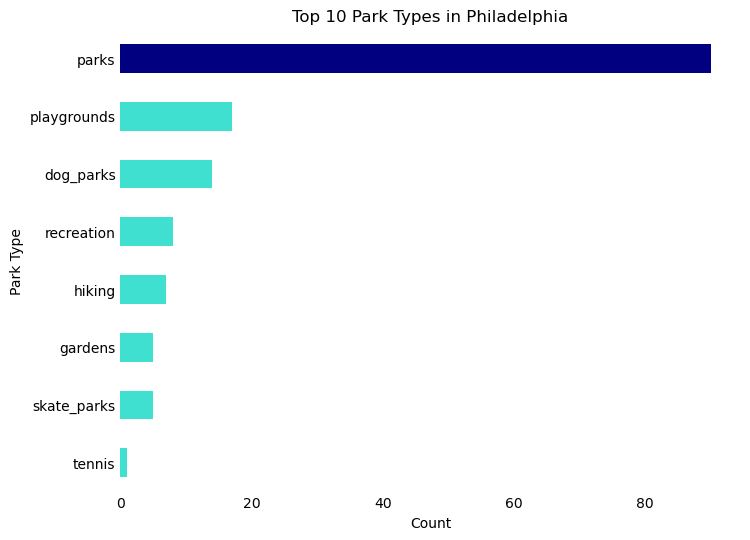

In [31]:
# Sort the DataFrame in descending order of 'count'
top_park_cat_sorted = top_park_cat.sort_values('count', ascending=False)

# Create a color list - default to turquoise, but navy for 'Pizza'
colors = ['navy' if x == 'parks' else 'turquoise' for x in top_park_cat_sorted['desc_1']]

# Create the horizontal bar plot with reversed axes
ax = top_park_cat_sorted.plot.barh(x='desc_1', y='count', figsize=(8, 6), color=colors)

# Remove the box (spines)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Remove tick marks
ax.tick_params(axis='x', length=0)
ax.tick_params(axis='y', length=0)

# Remove legend
ax.legend().set_visible(False)

# Rename axes
ax.set_xlabel('Count')
ax.set_ylabel('Park Type')

# Invert the y-axis to have the highest value at the top
ax.invert_yaxis()

# Add title
ax.set_title('Top 10 Park Types in Philadelphia')

# Display the plot
plt.show()

### Most common sub-category by neighborhood

The most common type of park and recreational space also varies citywide. Center City is dominated by parks, while the msot common sub-category in the Northeast is playgrounds. Interestingly, dog parks are the most common sub-category in Fishtown and Northern Liberties, two fast-developing neighborhoods in the lower northeast.

In [62]:
park_neigh = park.sjoin(neigh)
park_cat_neigh = park_neigh.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')
# get top park type by neighborhood
top_cat_neigh = park_cat_neigh.groupby("nb_name").apply(lambda x: x.nlargest(1, 'count')).reset_index(drop=True)

# join with neighborhoods
top_cat_neigh_gdf = top_cat_neigh.merge(neigh, on = "nb_name", how = "left")
top_cat_neigh_gdf = gpd.GeoDataFrame(top_cat_neigh_gdf, geometry = "geometry")
top_cat_neigh_gdf[["nb_name", "desc_1", "geometry"]].explore(tiles='CartoDB positron', legend=True, column='desc_1', cmap = "Set2")

In [33]:
park_tract = park.sjoin(phl_tract_proj)
park_cat_tract = park_tract.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')

cat_tract = park_cat_tract.groupby(["nb_name", "desc_1"])["count"].sum().reset_index()
# join with neighborhoods
cat_tract_gdf = cat_tract.merge(phl_tract_proj, on = "nb_name", how = "left")

cat_tract_gdf = gpd.GeoDataFrame(cat_tract_gdf, geometry = "geometry")

### Count by sub-category by tract
At the tract level, parks are most common in Center City, while recreation facilities are spread throughout the city. Hiking locations are most prevalent in the Northwest.

In [34]:
# tract base
tract_plot = phl_tract_proj.hvplot(crs=2272, geo=True, color="black", line_color="black", width=800, height=800)

# base
cat_tract_gdf_plot = cat_tract_gdf.hvplot(crs=2272, geo=True, c='count', cmap='magma', hover_cols='all', groupby="desc_1", width=800, height=800)

# combine
final_plot = tract_plot * cat_tract_gdf_plot
# reveal
final_plot = final_plot.opts(title="Park Type by Tract")

final_plot

:DynamicMap   [desc_1]
   :Overlay
      .Polygons.I  :Polygons   [Longitude,Latitude]
      .Polygons.II :Polygons   [Longitude,Latitude]   (count,index,nb_name,desc_1,area_mi2)

## Shopping
The three most common shopping sub-categories in Philadelphia are women's clothing, jewelry, and galleries. These are followed closely by discount stores and furniture stores.

In [63]:
## shopping
shop = amenity_point[amenity_point["type"] == "shopping"]
shop_cat = shop.groupby("desc_1").size().sort_values(ascending=False).reset_index(name='count')
top_shop_cat = shop_cat.head(10)

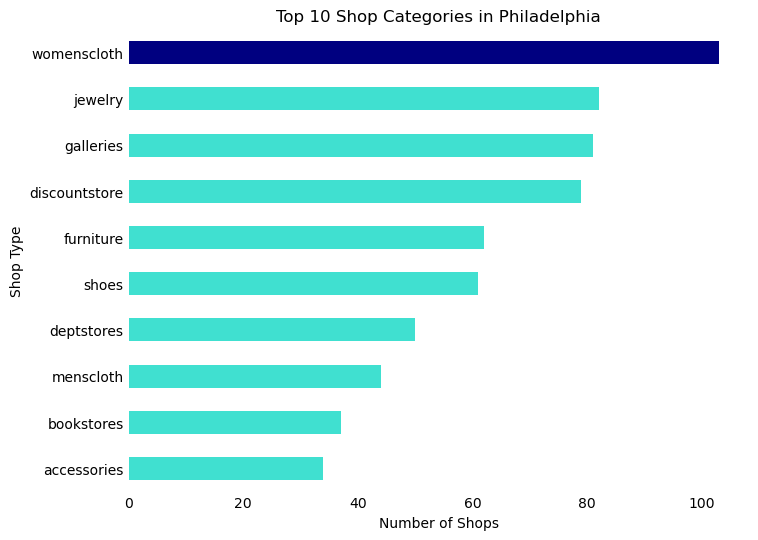

In [65]:
# Sort the DataFrame in descending order of 'count'
top_shop_cat_sorted = top_shop_cat.sort_values('count', ascending=False)

# Create a color list - default to turquoise, but navy for 'womenscloth'
colors = ['navy' if x == 'womenscloth' else 'turquoise' for x in top_shop_cat_sorted['desc_1']]

# Create the horizontal bar plot with reversed axes
ax = top_shop_cat_sorted.plot.barh(x='desc_1', y='count', figsize=(8, 6), color=colors)

# Remove the box (spines)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Remove tick marks
ax.tick_params(axis='x', length=0)
ax.tick_params(axis='y', length=0)

# Remove legend
ax.legend().set_visible(False)

# Invert the y-axis to have the highest value at the top
ax.invert_yaxis()

# Rename axes
ax.set_xlabel('Number of Shops')
ax.set_ylabel('Shop Type')

# Add title
ax.set_title('Top 10 Shop Categories in Philadelphia')

# Display the plot
plt.show()

### Most common sub-category by neighborhood
Discount stores are most common on the outskirts of the city. In the dense downtown area, women's clothing and galleries are more common. Antique stores cluster in the northeast, while bookstores appear concentrated west of the Schuylkill River in University City and Southwest Philadelphia.

In [37]:
shop_neigh = shop.sjoin(neigh)
shop_cat_neigh = shop_neigh.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')
# get top shop type by neighborhood
top_cat_neigh = shop_cat_neigh.groupby("nb_name").apply(lambda x: x.nlargest(1, 'count')).reset_index(drop=True)

# join with neighborhoods
top_cat_neigh_gdf = top_cat_neigh.merge(neigh, on = "nb_name", how = "left")
top_cat_neigh_gdf = gpd.GeoDataFrame(top_cat_neigh_gdf, geometry = "geometry")
top_cat_neigh_gdf = top_cat_neigh_gdf[top_cat_neigh_gdf["count"] >= 2]
top_cat_neigh_gdf[["nb_name", "desc_1", "geometry"]].explore(tiles='CartoDB positron', legend=True, column='desc_1')

In [38]:
shop_tract = shop.sjoin(phl_tract_proj)
shop_cat_tract = shop_tract.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')

cat_tract = shop_cat_tract.groupby(["nb_name", "desc_1"])["count"].sum().reset_index()
# join with neighborhoods
cat_tract_gdf = cat_tract.merge(phl_tract_proj, on = "nb_name", how = "left")

cat_tract_gdf = gpd.GeoDataFrame(cat_tract_gdf, geometry = "geometry")

### Count by sub-category by tract
Just like the previous amenity categories, shopping locales experience high levels of clustering. Galleries are clustered in Old City, discount stores in the south and northeast, and women's clothing in Center City.

In [66]:
# tract base
tract_plot = phl_tract_proj.hvplot(crs=2272, geo=True, color="black", line_color="black", width=800, height=800)

# base
cat_tract_gdf_plot = cat_tract_gdf.hvplot(crs=2272, geo=True, c='count', cmap='magma', hover_cols='all', groupby="desc_1", width=800, height=800)

# combine
final_plot = tract_plot * cat_tract_gdf_plot
# reveal
final_plot = final_plot.opts(title="Shop Type by Tract")

final_plot

:DynamicMap   [desc_1]
   :Overlay
      .Polygons.I  :Polygons   [Longitude,Latitude]
      .Polygons.II :Polygons   [Longitude,Latitude]   (count,index,nb_name,desc_1,area_mi2)

## Education
Childcare facilities emerge as the most common type of educational amenity in our analysis. We categorize these under education, acknowledging the importance of early childhood education as a foundation comparable to K-12 and higher education institutions. Following childcare, the most frequent educational facilities are elementary schools, preschools, and colleges/universities, in that order.

In [67]:
## edu
edu = amenity_point[amenity_point["type"] == "education"]
edu_cat = edu.groupby("desc_1").size().sort_values(ascending=False).reset_index(name='count')
top_edu_cat = edu_cat.head(10)

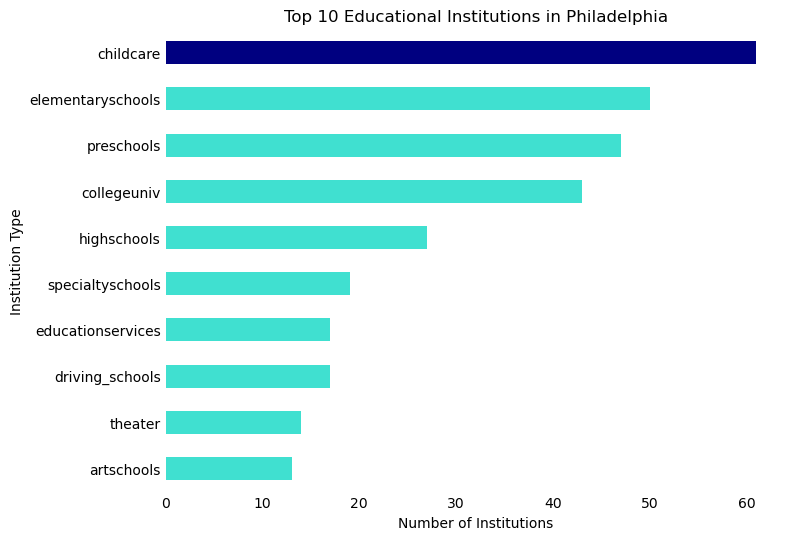

In [68]:
# Sort the DataFrame in descending order of 'count'
top_edu_cat_sorted = top_edu_cat.sort_values('count', ascending=False)

# Create a color list - default to turquoise, but navy for 'Pizza'
colors = ['navy' if x == 'womenscloth' else 'turquoise' for x in top_shop_cat_sorted['desc_1']]

# Create the horizontal bar plot with reversed axes
ax = top_edu_cat_sorted.plot.barh(x='desc_1', y='count', figsize=(8, 6), color=colors)

# Remove the box (spines)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Remove tick marks
ax.tick_params(axis='x', length=0)
ax.tick_params(axis='y', length=0)

# Remove legend
ax.legend().set_visible(False)

# Rename axes
ax.set_xlabel('Number of Institutions')
ax.set_ylabel('Institution Type')

# Invert the y-axis to have the highest value at the top
ax.invert_yaxis()

# Add title
ax.set_title('Top 10 Educational Institutions in Philadelphia')

# Display the plot
plt.show()

### Most common sub-category by neighborhood
In the Northeast and certain parts of Center City, childcare facilities are the predominant educational institutions. This, coupled with the significant number of playgrounds in these areas, positions the Northeast as a region likely more tailored to families with young children. Meanwhile, Center City and University City, along with a neighborhood in the north, are characterized mainly by the presence of colleges and universities. In the northwest, three neighborhoods stand out where preschools are the most frequent educational facilities, further indicating that Philadelphia's suburbs are particularly accommodating for families with young children.

In [42]:
edu_neigh = edu.sjoin(neigh)
edu_cat_neigh = edu_neigh.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')
# get top edu type by neighborhood
top_cat_neigh = edu_cat_neigh.groupby("nb_name").apply(lambda x: x.nlargest(1, 'count')).reset_index(drop=True)

# join with neighborhoods
top_cat_neigh_gdf = top_cat_neigh.merge(neigh, on = "nb_name", how = "left")
top_cat_neigh_gdf = gpd.GeoDataFrame(top_cat_neigh_gdf, geometry = "geometry")
top_cat_neigh_gdf = top_cat_neigh_gdf[top_cat_neigh_gdf["count"] >= 2]
top_cat_neigh_gdf[["nb_name", "desc_1", "geometry"]].explore(tiles='CartoDB positron', legend=True, column='desc_1')

### Count by sub-category by tract
As highlighted earlier, higher education institutions predominantly cluster around the downtown area. In contrast, educational facilities for young children, such as childcare centers and preschools, are more dispersed throughout the suburbs. This spatial distribution underscores the distinct educational dynamics between the city center and suburban areas.

In [43]:
edu_tract = edu.sjoin(phl_tract_proj)
edu_cat_tract = edu_tract.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')

cat_tract = edu_cat_tract.groupby(["nb_name", "desc_1"])["count"].sum().reset_index()
# join with neighborhoods
cat_tract_gdf = cat_tract.merge(phl_tract_proj, on = "nb_name", how = "left")

cat_tract_gdf = gpd.GeoDataFrame(cat_tract_gdf, geometry = "geometry")

In [44]:
# tract base
tract_plot = phl_tract_proj.hvplot(crs=2272, geo=True, color="black", line_color="black", width=800, height=800)

# base
cat_tract_gdf_plot = cat_tract_gdf.hvplot(crs=2272, geo=True, c='count', cmap='magma', hover_cols='all', groupby="desc_1", width=800, height=800)

# combine
final_plot = tract_plot * cat_tract_gdf_plot
# reveal
final_plot = final_plot.opts(title="Educational Institution by Tract")

final_plot

:DynamicMap   [desc_1]
   :Overlay
      .Polygons.I  :Polygons   [Longitude,Latitude]
      .Polygons.II :Polygons   [Longitude,Latitude]   (count,index,nb_name,desc_1,area_mi2)

# Neighborhood Amenity Typologies

Building on the spatial trends identified in the previous section, we observed that both amenity categories and their sub-categories exhibit distinct spatial patterns across Philadelphia. Certain areas of the city are marked by the dominance of specific amenity categories. This section aims to leverage our earlier analysis of counts and percentage shares of each amenity category and sub-category in Philadelphia's neighborhoods. Our goal is to develop a set of typologies that effectively encapsulate the diverse amenity mix within these neighborhoods. Through this endeavor, we seek to answer two key questions:

- What are the prevalent neighborhood amenity typologies in Philadelphia?
- How can this information be beneficial for residents, visitors, researchers, and urban planners?

## K-Means Cluster Analysis

Following the detailed exploration of amenity prevalence across Philadelphia, our next step is to define distinct amenity profiles for each census tract. While we have high-resolution data illustrating a rich diversity of amenities, we require a more streamlined approach to interpret how this mix of amenities varies across the city. To achieve this, we employ K-means cluster analysis. This method will group census tracts into clusters based on similarities in their amenity type ratios.

The K-means algorithm operates by categorizing observations into clusters. These clusters are formed based on the similarity of values across selected variables. Initially, the user specifies the desired number of clusters. The algorithm then assigns each observation to a cluster, aiming to minimize the distance between the observation and the cluster's centroid. This process is iteratively refined, continually reducing the intra-cluster distances, until the algorithm converges on an optimal clustering solution.

The first step in this analysis involves creating a wide dataframe that encapsulates the percentage shares of each amenity type at the tract level.

In [71]:
amenity_tract_sum = amenity_tract.groupby("nb_name")["total_amenities"].first().reset_index()

In [72]:
amenities_nb_wide = amenity_tract.pivot_table(index='nb_name', columns='type', values='pct_share', fill_value=0).reset_index()
amenities_nb_wide = amenities_nb_wide.merge(amenity_tract_sum, on = "nb_name", how = "left")
amenities_nb_wide = amenities_nb_wide[amenities_nb_wide["total_amenities"] > 5]

Based on this dataframe, we use the "Elbow test" to calculate the optimal number of clusters to include. This test suggests that the optimal number is 7 clusters.

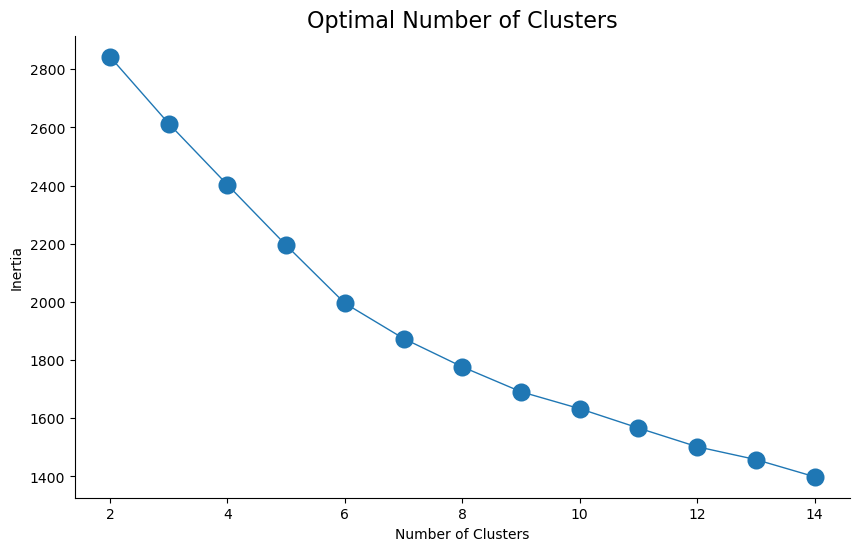

In [73]:
# Number of clusters to try out
n_clusters = list(range(2, 15))

amenities_nb_scaled = scaler.fit_transform(amenities_nb_wide[["arts", "beauty", "education", "entertainment", "grocery", "healthcare", "historic", "kids", "nightlife", "parks", "restaurant", "shopping"]])

# Run kmeans for each value of k
inertias = []
for k in n_clusters:
    
    # Initialize and run
    kmeans = KMeans(n_clusters=k, n_init=20)
    kmeans.fit(amenities_nb_scaled)
    
    # Save the "inertia"
    inertias.append(kmeans.inertia_)
    
# Plot it!
plt.figure(figsize=(10, 6))  # Adjust the figure size if needed
plt.plot(n_clusters, inertias, marker='o', ms=10, lw=1, mew=3)

# Add title
plt.title("Optimal Number of Clusters", fontsize=16)

# Remove the spines (box) around the plot
ax = plt.gca()  # Get current axes
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

# Optionally, you can add labels to the axes if needed
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")

# Show the plot
plt.show()

We then initialize the 7 clusters:

In [74]:
kmeans = KMeans(n_clusters=7, random_state=42, n_init=20)

Using StandardScaler(), we create a scaled version of our data to account for differences in the scales of the amenity types.

In [75]:
amenities_nb_scaled = scaler.fit_transform(amenities_nb_wide[["arts", "beauty", "education", "entertainment", "grocery", "healthcare", "historic", "kids", "nightlife", "parks", "restaurant", "shopping"]])

We fit this scaled data and extract the resulting cluster labels, which we merge with our wide dataset.

In [76]:
# Perform the fit
kmeans.fit(amenities_nb_scaled)

# Extract the labels
amenities_nb_wide['cluster'] = kmeans.labels_

We join the resulting dataframe with our initial tract boundaries, making it a geodataframe. We then rename the clusters based on their predominant amenity profile.

In [77]:
amenities_clusters = amenities_nb_wide.merge(phl_tract, how = "left", on = "nb_name")
amenities_clusters_gdf = gpd.GeoDataFrame(amenities_clusters, geometry = "geometry")

In [78]:
# Define the mapping for cluster labels
cluster_names = {
    0: "Restaurants and services",
    1: "Culture and leisure",
    2: "Shopping and services",
    3: "Wellness and retail",
    4: "Arts and culture",
    5: "Family friendly recreation",
    6: "Beauty and grooming services"
}

# Replace the cluster labels with the new names
amenities_clusters_gdf['cluster'] = amenities_clusters_gdf['cluster'].replace(cluster_names)
amenities_nb_wide['cluster'] = amenities_nb_wide['cluster'].replace(cluster_names)

When mapped by cluster, we see clear spatial patterns in the amenity profiles of neighborhoods.

In [86]:
amenities_clusters_gdf.explore(
    column="cluster",
    categorical=True,
    legend=True,
    cmap = "Accent",
    tiles="CartoDB positron"
)

The table below illustrates the percentage share of each amenity category within our seven identified clusters. We have named each cluster according to the predominant ratios of the various amenity types it comprises. In the following section, we describe and visualize in detail the composition and geographic spread of each cluster.

In [88]:
# Calculate the mean values of the amenities
mean_values = amenities_nb_wide.groupby("cluster")[["arts", "beauty", "education", "entertainment", "grocery", "healthcare", "historic", "kids", "nightlife", "parks", "restaurant", "shopping"]].mean().reset_index().round(0)

# Calculate the counts for each cluster
counts = amenities_nb_wide['cluster'].value_counts().rename_axis('cluster').reset_index(name='tracts')

# Merge the mean values and counts into one DataFrame
cluster_profile = pd.merge(mean_values, counts, on='cluster')

# Display the merged DataFrame
cluster_profile

,cluster,arts,beauty,education,entertainment,grocery,healthcare,historic,kids,nightlife,parks,restaurant,shopping,tracts
0,Arts and culture,11.0,8.0,12.0,16.0,10.0,0.0,0.0,4.0,18.0,3.0,8.0,9.0,37
1,Beauty and grooming services,1.0,45.0,7.0,2.0,8.0,0.0,0.0,1.0,4.0,0.0,26.0,7.0,50
2,Culture and leisure,3.0,13.0,10.0,15.0,5.0,0.0,10.0,8.0,12.0,5.0,9.0,9.0,8
3,Family friendly recreation,1.0,16.0,9.0,3.0,4.0,0.0,0.0,15.0,13.0,11.0,26.0,2.0,29
4,Restaurants and services,1.0,18.0,6.0,2.0,7.0,0.0,0.0,3.0,6.0,1.0,51.0,5.0,94
5,Shopping and services,1.0,21.0,6.0,5.0,9.0,0.0,0.0,5.0,11.0,1.0,18.0,23.0,58
6,Wellness and retail,1.0,19.0,3.0,6.0,16.0,8.0,0.0,5.0,6.0,10.0,12.0,14.0,4


## Cluster 1: Arts and culture
This cluster is a cultural hub with 11% arts venues, 16% entertainment options, and a vibrant 18% nightlife scene. Education is significant at 12%, while restaurants and shopping are moderately present at 8% and 9%, respectively. Grocery stores account for 10%, but there's no representation in healthcare, historic sites, or kid-friendly activities.

In [55]:
amenities_clusters_gdf[amenities_clusters_gdf["cluster"] == "Arts and culture"].explore(
    legend=True,
    tiles="CartoDB positron",
    color = "turquoise"
)

## Cluster 2: Beauty and grooming
Dominated by 45% beauty services, this cluster is a prime destination for grooming and wellness. Restaurants make up 26%, providing diverse dining experiences. There's a moderate presence of 7% educational institutions, 7% shopping, and 8% grocery stores. Entertainment and nightlife are relatively limited at 2% and 4%, respectively, with minimal focus on arts, historic sites, healthcare, parks, and kid-friendly activities.

In [56]:
amenities_clusters_gdf[amenities_clusters_gdf["cluster"] == "Beauty and grooming services"].explore(
    legend=True,
    tiles="CartoDB positron",
    color = "turquoise"
)

## Cluster 3: Culture and leisure
Blending 15% entertainment and 3% arts, this cluster is notable for its 10% historic sites and 8% kid-friendly options. Beauty services and restaurants are moderately available at 13% and 9%, respectively, along with 9% shopping. Education (10%), nightlife (12%), and parks (5%) are present, but grocery stores (5%) are less prominent, and there's no focus on healthcare.

In [57]:
amenities_clusters_gdf[amenities_clusters_gdf["cluster"] == "Culture and leisure"].explore(
    legend=True,
    tiles="CartoDB positron",
    color = "turquoise"
)

## Cluster 4: Family-friendly recreation
This cluster caters to families with 15% kid-friendly activities and 11% parks. Restaurants form a significant 26%, and beauty services are at 16%. There's some presence of 3% entertainment, 9% education, and 13% nightlife, but it's less focused on arts, shopping, grocery stores, healthcare, and historic sites.

In [58]:
amenities_clusters_gdf[amenities_clusters_gdf["cluster"] == "Family friendly recreation"].explore(
    legend=True,
    tiles="CartoDB positron",
    color = "turquoise"
)

## Cluster 5: Restaurants and services
A culinary hotspot, this cluster features 51% restaurants. Beauty services are also significant at 18%, followed by 7% grocery stores and 6% nightlife. Education (6%), arts (1%), entertainment (2%), and shopping (5%) are less prominent, with minimal emphasis on historic sites, healthcare, parks, and kid-friendly activities.

In [59]:
amenities_clusters_gdf[amenities_clusters_gdf["cluster"] == "Restaurants and services"].explore(
    legend=True,
    tiles="CartoDB positron",
    color = "turquoise"
)

## Cluster 6: Shopping and services
A retail center with 23% shopping and 21% beauty services. Restaurants contribute 18%, and grocery stores 9%. The cluster offers some 11% nightlife, 5% entertainment, and 5% kid-friendly options, but has a lower presence in arts, education, healthcare, historic sites, and parks.

In [60]:
amenities_clusters_gdf[amenities_clusters_gdf["cluster"] == "Shopping and services"].explore(
    legend=True,
    tiles="CartoDB positron",
    color = "turquoise"
)

## Cluster 7: Wellness and retail
Combining 19% beauty services and 16% grocery stores, this cluster is focused on wellness and retail. Shopping and restaurants are notable at 14% and 12%, respectively, along with some 6% entertainment and 6% nightlife. Parks are present at 10%, but there's limited focus on educational facilities, arts, and kid-friendly activities, with no healthcare or historic sites.

In [61]:
amenities_clusters_gdf[amenities_clusters_gdf["cluster"] == "Wellness and retail"].explore(
    legend=True,
    tiles="CartoDB positron",
    color = "turquoise"
)